In [2]:
import random
import tempfile
# from PIL import Image
from torchvision import datasets, transforms

test_folder = '/disk/data/imagenet/val'
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    normalize,
])

size_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])

transformed_dataset = datasets.ImageFolder(test_folder, transform=test_transform)
raw_dataset = datasets.ImageFolder(test_folder,transform=size_transform)


In [3]:
import json

with open('readable_class_names.json', 'rb') as file:
    content = file.read()
    dictionary = json.loads(content)
    readable_class_name = {}
    for key, value in dictionary.items():
        readable_class_name[int(key)] = value

readable_class_name

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

In [4]:
import torch

to_pil = transforms.ToPILImage()

torch.manual_seed(123)
batch_size = 64
image_ids = torch.randint(0, len(transformed_dataset), (batch_size, ))

batch_data = torch.zeros((batch_size, 3, 224, 224))
raw_image = torch.zeros((batch_size, 3, 224, 224))
label = torch.zeros((batch_size), 1)
class_name = []
readable = []

for i, idx in enumerate(image_ids):
    batch_data[i] = transformed_dataset[idx][0]
    raw_image[i], label[i] = raw_dataset[idx]
    for name, index in raw_dataset.class_to_idx.items():
        if index == label[i]:
            class_name.append(name)
            readable.append(readable_class_name[index])
            break
#     print('%d/%d' % (idx, len(raw_dataset)), class_name[-1], readable[-1])
#     display(to_pil(raw_image[i]))
#     display(to_pil(batch_data[i]))

print(batch_data[i].device)

cpu


In [5]:
import sys
import re
sys.path.append('..')
from models import model_dict

split_symbol = ':'
def get_model_name(model_path):
    """parse model name"""
    directory = model_path.split('/')[-2]
    pattern = ''.join(['S', split_symbol, '(.+)', '_T', split_symbol])
    name_match = re.match(pattern, directory)
    if name_match:
        return name_match[1]
    segments = directory.split('_')
    if segments[0] == 'wrn':
        return segments[0] + '_' + segments[1] + '_' + segments[2]
    if segments[0] == 'resnext50':
        return segments[0] + '_' + segments[1]
    if segments[0] == 'vgg13' and segments[1] == 'imagenet':
        return segments[0] + '_' + segments[1]
    return segments[0]

def load_model(model_path, n_cls, gpu=None):
    print('==> loading model')
    model_t = get_model_name(model_path)
    model = model_dict[model_t](num_classes=n_cls)
    map_location = torch.device('cpu')
    model.load_state_dict(torch.load(model_path, map_location=map_location)['model'])
    print('==> done')
    return model

dataset = 'imagenet'

if dataset == 'imagenet':
    n_cls = 1000

# load teacher model and forward
model_path = '../save/models/ResNet34_vanilla/resnet34_transformed.pth'
teacher = load_model(model_path, n_cls)
teacher.eval()
hidden_layers_t, scores_t = teacher(batch_data, True)
cl_t = scores_t.argmax(dim=1)

# load student model and forward
method_strings = ['hint_r:1.0_a:1.0_b:100.0',
           'kd_r:1.0_a:1.0_b:0.0', 'similarity_r:1.0_a:1.0_b:3000.0', 'vid_r:1.0_a:1.0_b:1.0']
student_paths = list(map(lambda x: '../save/student_model/S:ResNet18_T:ResNet34_imagenet_' + x \
                    + '_release_dali:gpu/ResNet18_best.pth', method_strings))
student_paths.append('../save/student_model/S:ResNet18_T:ResNet34_imagenet_attention_r:1.0_a:1.0_b:1000.0_att_dali:gpu/ResNet18_best.pth')
student_paths.append('../save/student_model/S:ResNet18_T:ResNet18Double_imagenet_hkd_r:1.0_a:1.0_b:1.0_hkd_dali:gpu/ResNet18_best.pth')
student_paths.append('../save/student_model/S:ResNet18_T:ResNet34_imagenet_aakd_r:1.0_a:1.0_b:50.0_0_dali:gpu/ResNet18_best.pth')
methods = ['fitnet', 'kd', 'similarity', 'vid', 'att', 'hkd', 'aakd']

students = list(map(lambda path: load_model(path, n_cls), student_paths))


==> loading model
==> done
==> loading model
==> done
==> loading model
==> done
==> loading model
==> done
==> loading model
==> done
==> loading model
==> done
==> loading model
==> done
==> loading model
==> done


In [6]:
def check(i):
        print('%d/%d' % (image_ids[i], len(raw_dataset)), class_name[i], readable[i])
#         display(to_pil(raw_image[i]))
        label_id = label[i].item()

        # Teacher
        print('label: %d' % (label_id))
        teacher_class_id = cl_t[i].item()
        teacher_class_name = readable_class_name[teacher_class_id]
        print('Teacher result: class id %d name %s score %f, label score %f' % (
            teacher_class_id, teacher_class_name, scores_t[i, teacher_class_id], scores_t[i, int(label_id)]
        ))

        # Student
        student_class_id = cl_s[i].item()
        student_class_name = readable_class_name[student_class_id]
        print('Student result: class id %d name %s score %f, label score %f' % (
            student_class_id, student_class_name, scores_s[i, student_class_id], scores_s[i, int(label_id)]
        ))

        teacher_misclassified = 1 if teacher_class_id != label_id else 0
        student_misclassified = 1 if student_class_id != label_id else 0
        return teacher_misclassified, student_misclassified
        
check_results = []
for student in students:
    hidden_layers_s, scores_s = student(batch_data, True)
    cl_s = scores_s.argmax(dim=1)

    f = []
    for i in range(len(image_ids)):
        f.append(check(i))
    check_results.append(f)
    
    print("%d/%d misclassified" % (sum(list(map(lambda x:x[0], f))), batch_size))

12382/50000 n02109525 Saint Bernard, St Bernard
label: 247
Teacher result: class id 247 name Saint Bernard, St Bernard score 11.320792, label score 11.320792
Student result: class id 247 name Saint Bernard, St Bernard score 11.627958, label score 11.627958
19789/50000 n02641379 gar, garfish, garpike, billfish, Lepisosteus osseus
label: 395
Teacher result: class id 6 name stingray score 13.579957, label score 7.555482
Student result: class id 6 name stingray score 10.786680, label score 5.565478
9102/50000 n02093754 Border terrier
label: 182
Teacher result: class id 182 name Border terrier score 21.459660, label score 21.459660
Student result: class id 182 name Border terrier score 19.862774, label score 19.862774
18610/50000 n02486410 baboon
label: 372
Teacher result: class id 372 name baboon score 14.097399, label score 14.097399
Student result: class id 372 name baboon score 12.357540, label score 12.357540
19580/50000 n02536864 coho, cohoe, coho salmon, blue jack, silver salmon, Onc

12382/50000 n02109525 Saint Bernard, St Bernard
label: 247
Teacher result: class id 247 name Saint Bernard, St Bernard score 11.320792, label score 11.320792
Student result: class id 247 name Saint Bernard, St Bernard score 12.240397, label score 12.240397
19789/50000 n02641379 gar, garfish, garpike, billfish, Lepisosteus osseus
label: 395
Teacher result: class id 6 name stingray score 13.579957, label score 7.555482
Student result: class id 6 name stingray score 11.425783, label score 6.176973
9102/50000 n02093754 Border terrier
label: 182
Teacher result: class id 182 name Border terrier score 21.459660, label score 21.459660
Student result: class id 182 name Border terrier score 19.832142, label score 19.832142
18610/50000 n02486410 baboon
label: 372
Teacher result: class id 372 name baboon score 14.097399, label score 14.097399
Student result: class id 372 name baboon score 12.425797, label score 12.425797
19580/50000 n02536864 coho, cohoe, coho salmon, blue jack, silver salmon, Onc

12382/50000 n02109525 Saint Bernard, St Bernard
label: 247
Teacher result: class id 247 name Saint Bernard, St Bernard score 11.320792, label score 11.320792
Student result: class id 247 name Saint Bernard, St Bernard score 11.430438, label score 11.430438
19789/50000 n02641379 gar, garfish, garpike, billfish, Lepisosteus osseus
label: 395
Teacher result: class id 6 name stingray score 13.579957, label score 7.555482
Student result: class id 296 name ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus score 9.233032, label score 6.706589
9102/50000 n02093754 Border terrier
label: 182
Teacher result: class id 182 name Border terrier score 21.459660, label score 21.459660
Student result: class id 182 name Border terrier score 20.012438, label score 20.012438
18610/50000 n02486410 baboon
label: 372
Teacher result: class id 372 name baboon score 14.097399, label score 14.097399
Student result: class id 372 name baboon score 11.277138, label score 11.277138
19580/50000 n02536864 coh

12382/50000 n02109525 Saint Bernard, St Bernard
label: 247
Teacher result: class id 247 name Saint Bernard, St Bernard score 11.320792, label score 11.320792
Student result: class id 247 name Saint Bernard, St Bernard score 11.891628, label score 11.891628
19789/50000 n02641379 gar, garfish, garpike, billfish, Lepisosteus osseus
label: 395
Teacher result: class id 6 name stingray score 13.579957, label score 7.555482
Student result: class id 6 name stingray score 10.416181, label score 4.932214
9102/50000 n02093754 Border terrier
label: 182
Teacher result: class id 182 name Border terrier score 21.459660, label score 21.459660
Student result: class id 182 name Border terrier score 20.104239, label score 20.104239
18610/50000 n02486410 baboon
label: 372
Teacher result: class id 372 name baboon score 14.097399, label score 14.097399
Student result: class id 106 name wombat score 13.885099, label score 12.775690
19580/50000 n02536864 coho, cohoe, coho salmon, blue jack, silver salmon, Onc

12382/50000 n02109525 Saint Bernard, St Bernard
label: 247
Teacher result: class id 247 name Saint Bernard, St Bernard score 11.320792, label score 11.320792
Student result: class id 247 name Saint Bernard, St Bernard score 12.442120, label score 12.442120
19789/50000 n02641379 gar, garfish, garpike, billfish, Lepisosteus osseus
label: 395
Teacher result: class id 6 name stingray score 13.579957, label score 7.555482
Student result: class id 6 name stingray score 11.267580, label score 7.116892
9102/50000 n02093754 Border terrier
label: 182
Teacher result: class id 182 name Border terrier score 21.459660, label score 21.459660
Student result: class id 182 name Border terrier score 19.330185, label score 19.330185
18610/50000 n02486410 baboon
label: 372
Teacher result: class id 372 name baboon score 14.097399, label score 14.097399
Student result: class id 372 name baboon score 12.922482, label score 12.922482
19580/50000 n02536864 coho, cohoe, coho salmon, blue jack, silver salmon, Onc

12382/50000 n02109525 Saint Bernard, St Bernard
label: 247
Teacher result: class id 247 name Saint Bernard, St Bernard score 11.320792, label score 11.320792
Student result: class id 247 name Saint Bernard, St Bernard score 11.655071, label score 11.655071
19789/50000 n02641379 gar, garfish, garpike, billfish, Lepisosteus osseus
label: 395
Teacher result: class id 6 name stingray score 13.579957, label score 7.555482
Student result: class id 6 name stingray score 10.099191, label score 6.483497
9102/50000 n02093754 Border terrier
label: 182
Teacher result: class id 182 name Border terrier score 21.459660, label score 21.459660
Student result: class id 182 name Border terrier score 21.299786, label score 21.299786
18610/50000 n02486410 baboon
label: 372
Teacher result: class id 372 name baboon score 14.097399, label score 14.097399
Student result: class id 372 name baboon score 12.489836, label score 12.489836
19580/50000 n02536864 coho, cohoe, coho salmon, blue jack, silver salmon, Onc

12382/50000 n02109525 Saint Bernard, St Bernard
label: 247
Teacher result: class id 247 name Saint Bernard, St Bernard score 11.320792, label score 11.320792
Student result: class id 247 name Saint Bernard, St Bernard score 10.834053, label score 10.834053
19789/50000 n02641379 gar, garfish, garpike, billfish, Lepisosteus osseus
label: 395
Teacher result: class id 6 name stingray score 13.579957, label score 7.555482
Student result: class id 6 name stingray score 11.852386, label score 5.934070
9102/50000 n02093754 Border terrier
label: 182
Teacher result: class id 182 name Border terrier score 21.459660, label score 21.459660
Student result: class id 182 name Border terrier score 21.109165, label score 21.109165
18610/50000 n02486410 baboon
label: 372
Teacher result: class id 372 name baboon score 14.097399, label score 14.097399
Student result: class id 372 name baboon score 11.534754, label score 11.534754
19580/50000 n02536864 coho, cohoe, coho salmon, blue jack, silver salmon, Onc

In [7]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

class FeatureExtractor():
    """ Class for extracting activations and 
    registering gradients from targetted intermediate layers """

    def __init__(self, model, target_layers):
        self.model = model
        self.target_layers = target_layers
        self.gradients = []

    def save_gradient(self, grad):
        self.gradients.append(grad)

    def __call__(self, x):
        outputs = []
        self.gradients = []
        for name, module in self.model._modules.items():
            x = module(x)
            if name in self.target_layers:
                x.register_hook(self.save_gradient)
                outputs += [x]
        return outputs, x


class ModelOutputs():
    """ Class for making a forward pass, and getting:
    1. The network output.
    2. Activations from intermeddiate targetted layers.
    3. Gradients from intermeddiate targetted layers. """

    def __init__(self, model, feature_module, target_layers):
        self.model = model
        self.feature_module = feature_module
        self.feature_extractor = FeatureExtractor(self.feature_module, target_layers)

    def get_gradients(self):
        return self.feature_extractor.gradients

    def __call__(self, x):
        target_activations = []
        for name, module in self.model._modules.items():
            if module == self.feature_module:
                target_activations, x = self.feature_extractor(x)
            elif "avgpool" in name.lower():
                x = module(x)
                x = x.view(x.size(0),-1)
            else:
                x = module(x)
        
        return target_activations, x

def merge_cam_with_image(img, mask):
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    heatmap = np.float32(heatmap) / 255
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    return cam


class GradCam:
    def __init__(self, model, feature_module, target_layer_names, use_cuda):
        self.model = model
        self.feature_module = feature_module
        self.model.eval()
        self.cuda = use_cuda
        if self.cuda:
            self.model = model.cuda()

        self.extractor = ModelOutputs(self.model, self.feature_module, target_layer_names)

    def forward(self, input):
        return self.model(input)

    def __call__(self, input, index=None):
        if self.cuda:
            features, output = self.extractor(input.cuda())
        else:
            features, output = self.extractor(input)

        if index == None:
            index = np.argmax(output.cpu().data.numpy())

        one_hot = np.zeros((1, output.size()[-1]), dtype=np.float32)
        one_hot[0][index] = 1
        one_hot = torch.from_numpy(one_hot).requires_grad_(True)
        if self.cuda:
            one_hot = torch.sum(one_hot.cuda() * output)
        else:
            one_hot = torch.sum(one_hot * output)

        self.feature_module.zero_grad()
        self.model.zero_grad()
        one_hot.backward(retain_graph=True)

        grads_val = self.extractor.get_gradients()[-1].cpu().data.numpy()

        target = features[-1]
        target = target.cpu().data.numpy()[0, :]

        weights = np.mean(grads_val, axis=(2, 3))[0, :]
        cam = np.zeros(target.shape[1:], dtype=np.float32)

        for i, w in enumerate(weights):
            cam += w * target[i, :, :]

        cam = np.maximum(cam, 0)
        cam = cv2.resize(cam, input.shape[2:])
        cam = cam - np.min(cam)
        cam = cam / np.max(cam)
        return cam

class ImageLayout:
    def __init__(self, row=2, column=5, figsize=(28, 28)):
        self.idx = 0
        self.row = row
        self.column = column
        self.fig = plt.figure(figsize=figsize)
        
    def reset(self):
        self.idx = 0
        
    def draw_image(self, image, title):
        image = image.squeeze()
        image = image.data

        self.idx += 1
        temp = self.fig.add_subplot(self.row, self.column, self.idx)
        temp.set_title(title)
        plt.imshow(image)
    
    def display(self):
        plt.tight_layout()
        plt.show()

goose


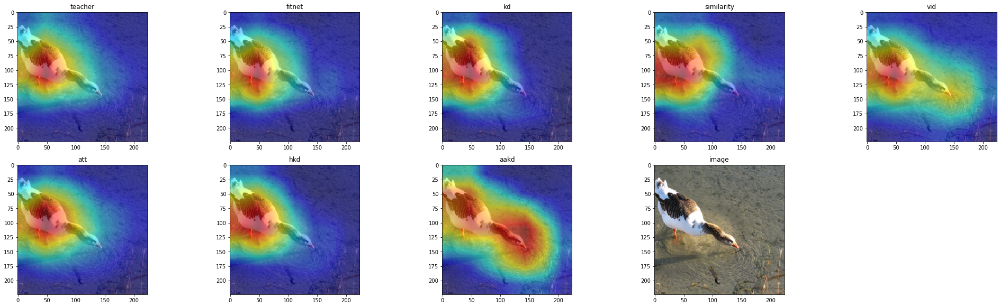

In [8]:
from PIL import Image
import os

def compare(image_id, save=False):
    image_layout = ImageLayout(7, 5)

    image, label = transformed_dataset[image_id]
    raw = raw_dataset[image_id][0].numpy().transpose(1, 2, 0)
    
    class_name = readable_class_name[label]
    directory = 'pics/' + class_name + '/'
    
    if not os.path.exists(directory):
        os.makedirs(directory)

    def visualize(model, image, feature_module, target_layer_names, title):
        grad_cam = GradCam(model=model, feature_module=feature_module, \
                               target_layer_names=target_layer_names, use_cuda=False)
        mask = grad_cam(image.unsqueeze(0))
        res = merge_cam_with_image(raw, mask)
        image_layout.draw_image(res, title)
        
        if save:
            name = directory + title + '.png'
            im = Image.fromarray(np.uint8(res * 255))
            im.save(name)
#             save_image(torch.tensor(res), name)

    visualize(teacher, image, teacher.layer4, ['2'], 'teacher')

    for i, method in enumerate(methods):
        model = students[i]
        modules = [model.layer4, model.layer3, model.layer2, model.layer1]
        visualize(model, image, model.layer4, ['1'], method)

    print(class_name)
    image_layout.draw_image(raw, 'image')

    image_layout.display()
    if save:
        name = directory + 'image.png'
        im = Image.fromarray(np.uint8(raw * 255))
        im.save(name)
        

compare(4958, save=True)

analog clock


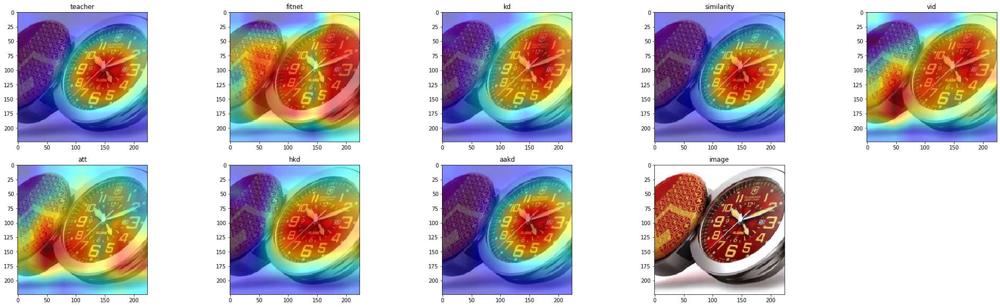

racer, race car, racing car


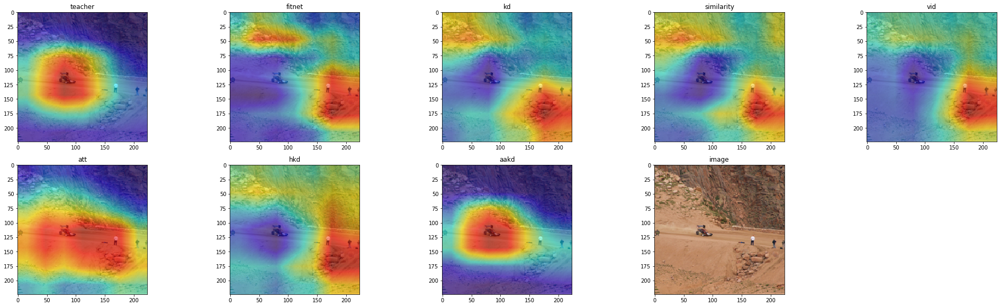

rain barrel


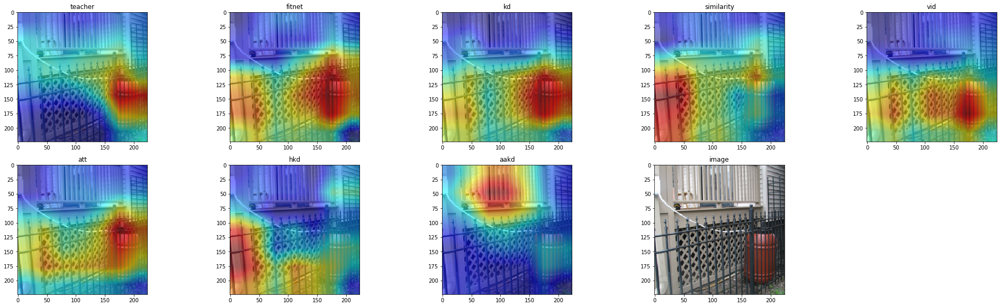

loudspeaker, speaker, speaker unit, loudspeaker system, speaker system


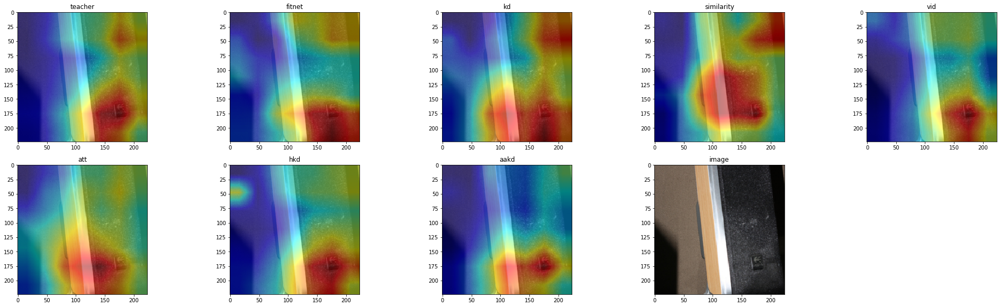

hatchet


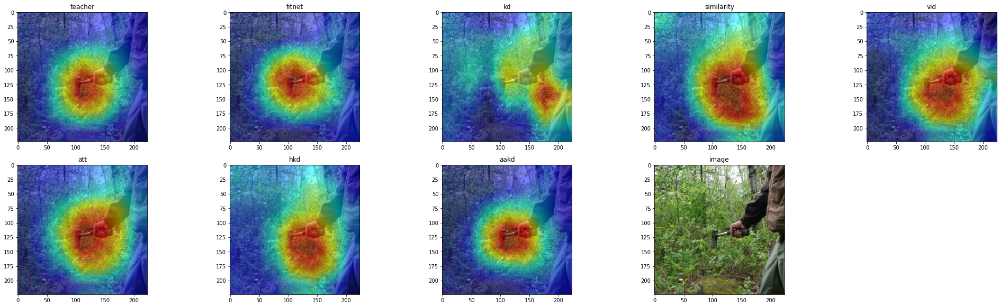

projectile, missile


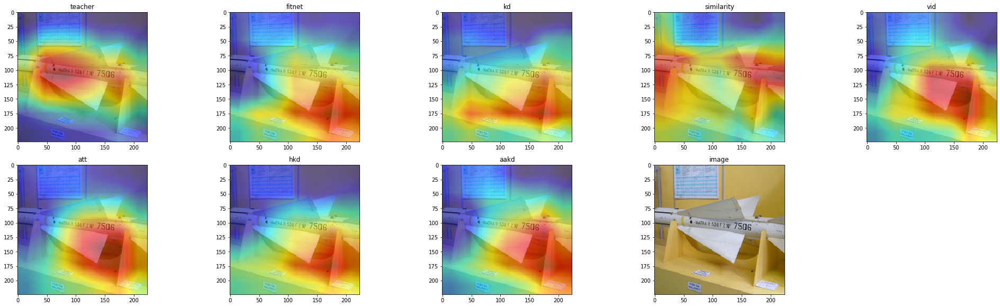

rock crab, Cancer irroratus


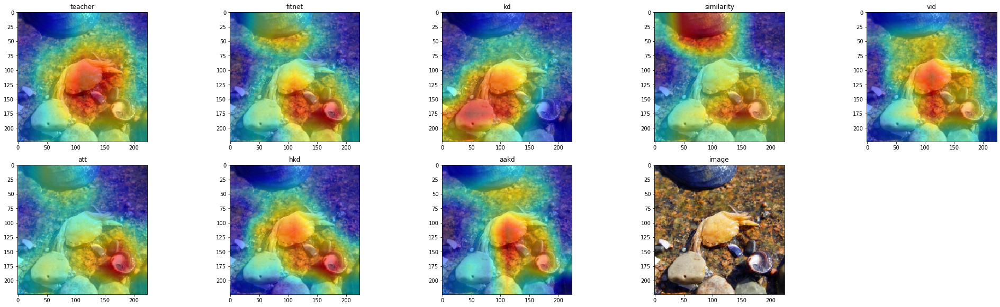

saltshaker, salt shaker


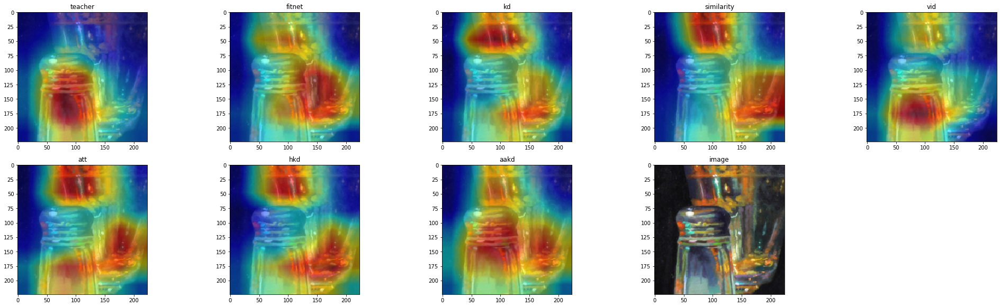

wool, woolen, woollen


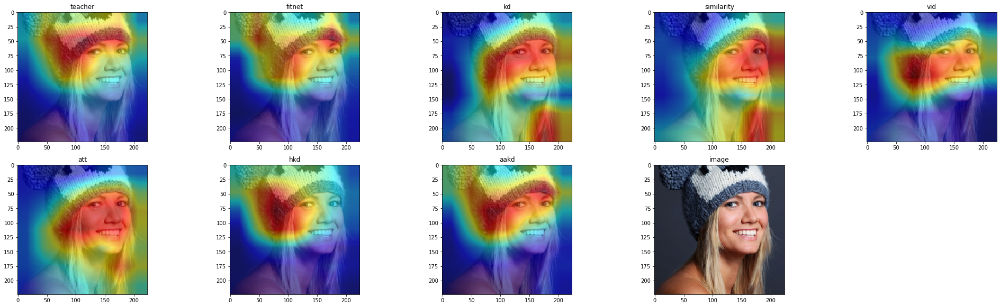

bathtub, bathing tub, bath, tub


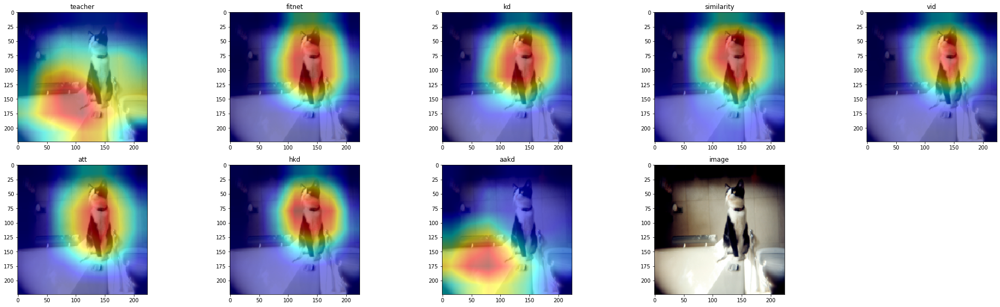

In [9]:
## Selected
l = [20451, 37565, 37828, 31630, 29822, 37209, 5972, 38687, 45598, 21776,]
for image_id in l:
    compare(image_id, save=True)

bow tie, bow-tie, bowtie


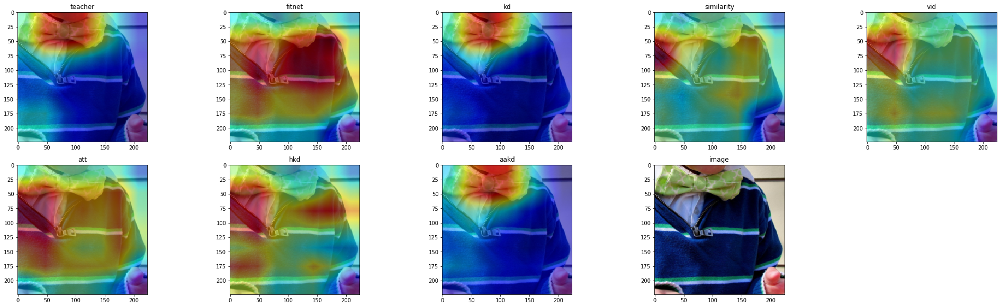

banana


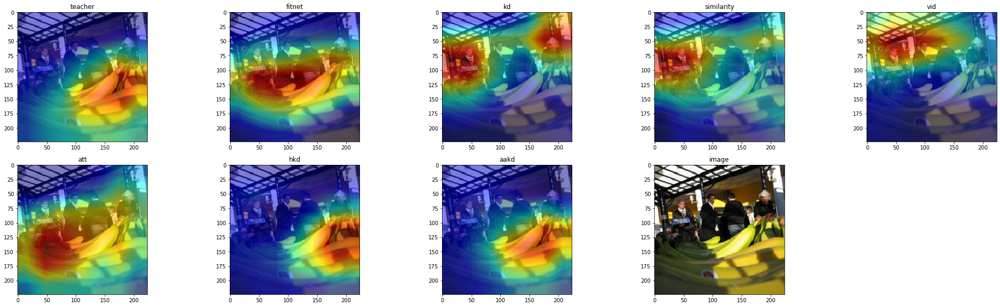

Band Aid


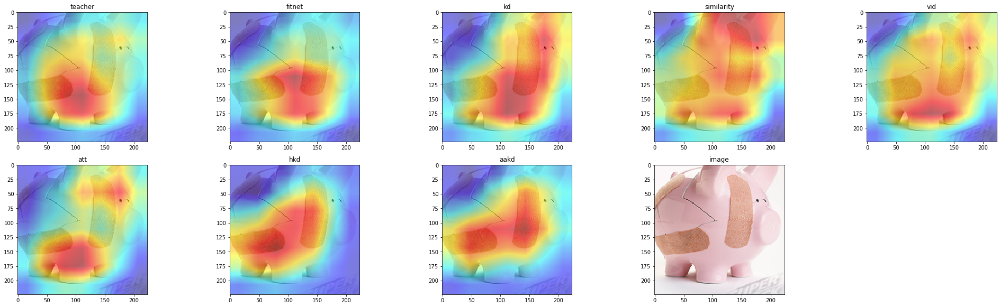

sweatshirt


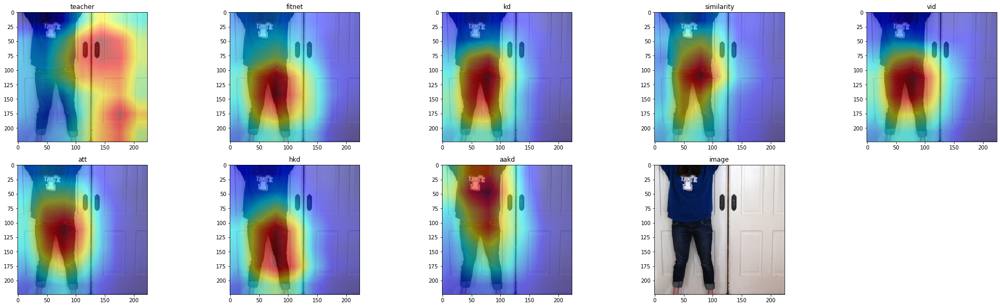

hard disc, hard disk, fixed disk


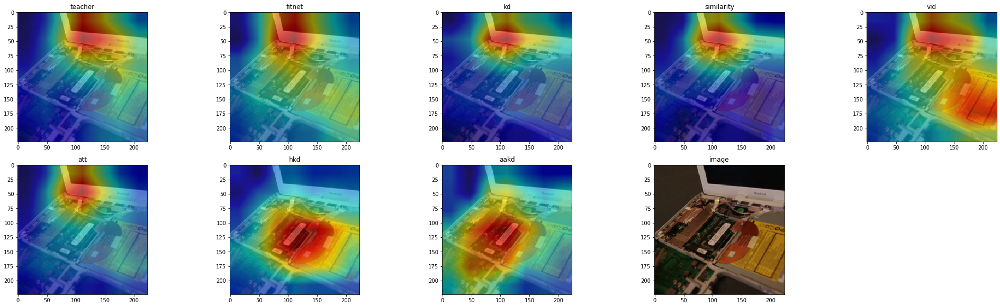

In [10]:
## Selected
for i in [22851, 47745, 20994, 42051, 29648]:
    compare(i)